# Web Mining and NER in Python
## Analysis and Interpretation
### Phase 4 by Illia Nesterenko

### Introduction

This notebook contains the code and subsequent commentaries on the execution of the fourth phase of the Web Mining and NER in Python project. The end goal of the project is to "explore how artificial intelligence can be applied to extract meaningful entities from vast textual data and establish connections between them". The fourth phase of the project covers all of "graph analysis" parts, including centrality and cluster analysis. Below is the walkthrough through the whole process with code and my comments (when needed).

In [1]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans, DBSCAN, HDBSCAN, OPTICS
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.patheffects as path_effects
import networkx as nx
from networkx.readwrite import json_graph
import json


In [2]:
DARK_BLUE = '#440154'

In [3]:
# Load the graph from the JSON file
with open('graph.json', 'r') as f:
    graph_data = json.load(f)

# Convert the JSON-serializable format back to a NetworkX graph
G = json_graph.node_link_graph(graph_data)
# Convert the graph to an adjacency matrix (for clustering)
adj_matrix = nx.to_numpy_array(G)

## Centrality Analysis

In [4]:
# Calculate degree and betweennes centralities and store their values in a list.
degree_centrality = nx.degree_centrality(G)
centrality_values = list(degree_centrality.values())

betweenness_centrality = nx.betweenness_centrality(G)
btw_centrality_values = list(betweenness_centrality.values())

In [5]:
# Sort nodes by centrality values in descending order and get the top 15
sorted_nodesD = sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True)
top_15_nodesD = sorted_nodesD[:15]

# Get the top 15 node names
top_15_node_namesD = [node for node, _ in top_15_nodesD]
print(top_15_node_namesD)

# Sort nodes by centrality values in descending order and get the top 15
sorted_nodesB = sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True)
top_15_nodesB = sorted_nodesB[:15]

# Get the top 15 node names
top_15_node_namesB = [node for node, _ in top_15_nodesB]
print(top_15_node_namesB)

['russia', 'russian', 'ukraine', 'united nations', 'bbc news', 'vladimir putin', 'europe', 'un', 'putin', 'washington', 'russians', 'european', 'united states', 'chechen', 'american']
['russia', 'russian', 'ukraine', 'vladimir putin', 'united nations', 'bbc news', 'europe', 'un', 'putin', 'washington', 'russians', 'united states', 'chechen', 'european', 'soviet']


We will start from visualizing our graph properly. Scaling down edge by lowering alpha, adding edge color, will let us get a proper look at the graph.

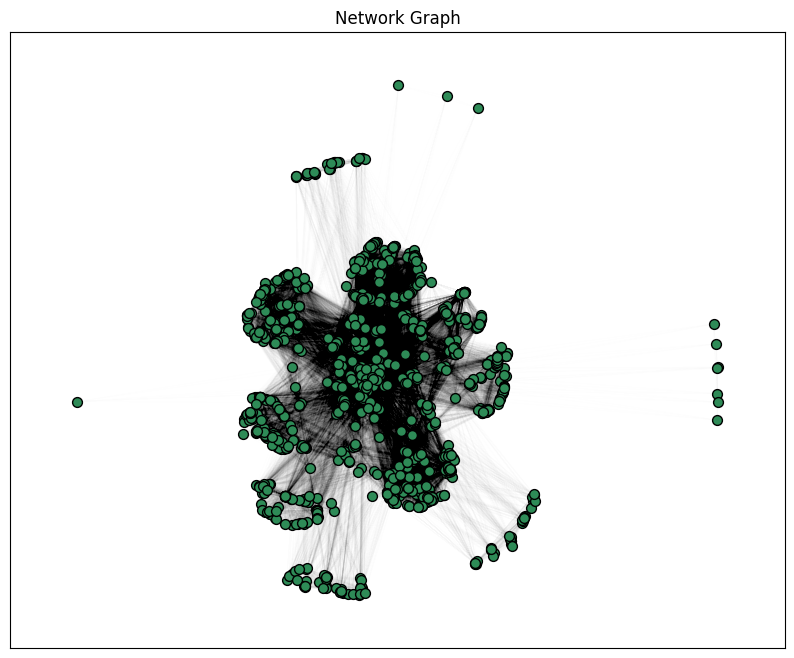

In [6]:
# Use a layout
pos = nx.spring_layout(G, seed=42)

plt.figure(figsize=(10, 8))
nodes = nx.draw_networkx_nodes(G, pos, node_color='seagreen', node_size=50, edgecolors='black')
edges = nx.draw_networkx_edges(G, pos, alpha=.0025)
plt.title('Network Graph')
plt.show()

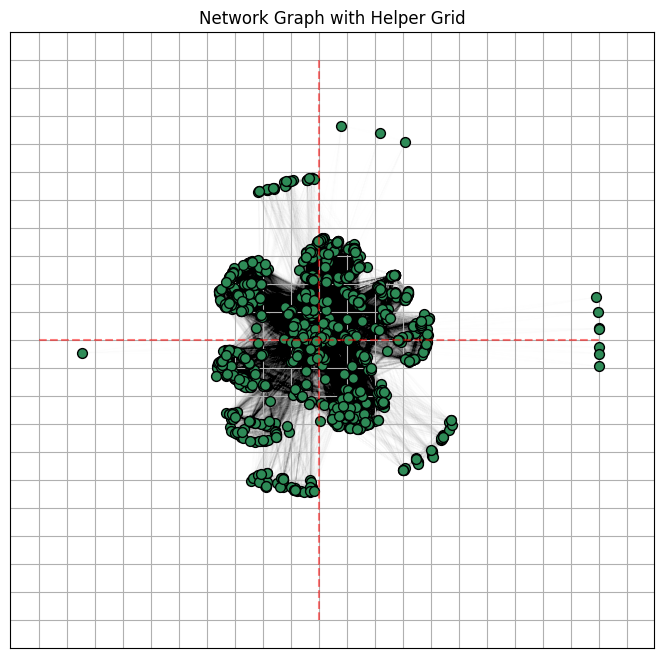

In [7]:
pos = nx.spring_layout(G, seed=42)

plt.figure(figsize=(10, 8))
nodes = nx.draw_networkx_nodes(G, pos, node_color='seagreen', node_size=50, edgecolors='black')
edges = nx.draw_networkx_edges(G, pos, alpha=.0025)

# Helper grid for future zooming
plt.plot([-1, 1], [0,0], 'r--', alpha=.5)
plt.plot([0, 0], [-1,1], 'r--', alpha=.5)
plt.gca().set_aspect('equal')
plt.xticks(np.arange(-1,1.2,.1))
plt.yticks(np.arange(-1,1.2,.1))

plt.grid(True)
plt.title('Network Graph with Helper Grid')
plt.show()

Here we see the core of the graph with several outlier groups. Let's zoom in to take a look at the core without the outliers.

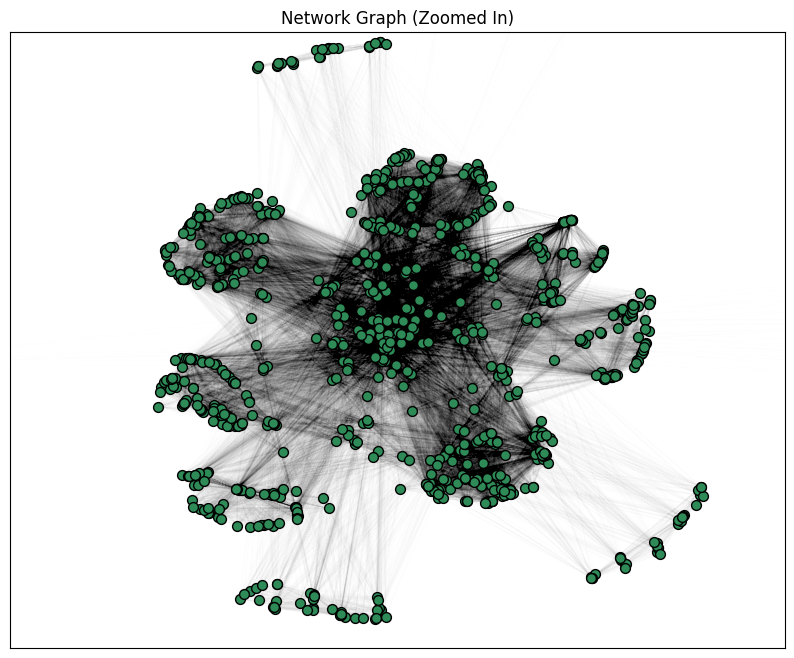

In [8]:
# Use a layout
pos = nx.spring_layout(G, seed=42) 

plt.figure(figsize=(10, 8)) 
nodes = nx.draw_networkx_nodes(G, pos, node_color='seagreen', node_size=50, edgecolors='black')
edges = nx.draw_networkx_edges(G, pos, alpha=.0025)
plt.title('Network Graph (Zoomed In)')
plt.xlim(-.6, .6)
plt.ylim(-.6, .6)
plt.show()

We see that the core is itself looks like a conglomerate of several groups. Since we are using a spring layout, the most interconnected nodes are brought to each other and are placed closer to the center. Let's zoom in further to take a look at the center of the core.

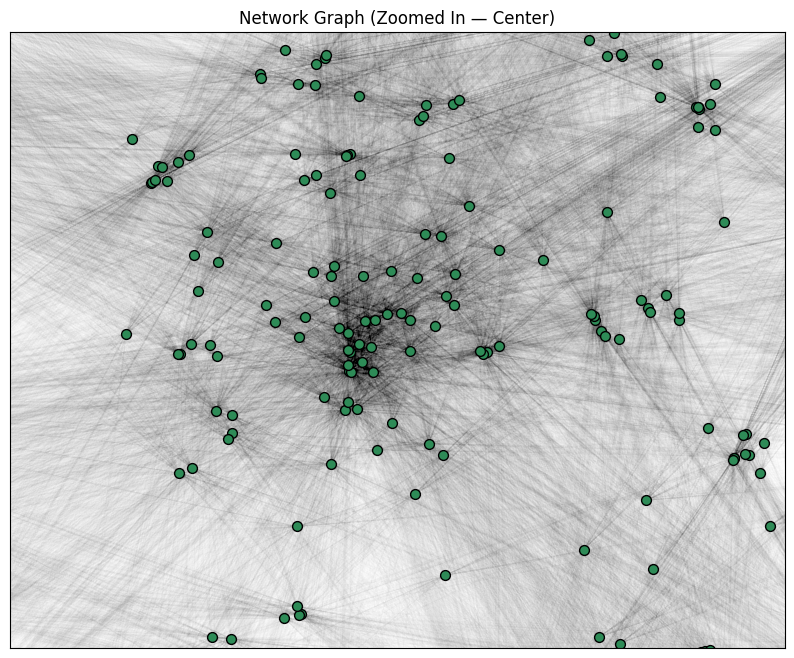

In [9]:
# Use a layout
pos = nx.spring_layout(G, seed=42)  # You can choose a layout that fits your graph well

plt.figure(figsize=(10, 8))  # Set the size of the plot (you can adjust it to your needs)
nodes = nx.draw_networkx_nodes(G, pos, node_color='seagreen', node_size=50, edgecolors='black')
edges = nx.draw_networkx_edges(G, pos, alpha=.0025)
plt.title('Network Graph (Zoomed In — Center)')
plt.xlim(-0.18, 0.18)
plt.ylim(-0.18, 0.18)
plt.show()

Given that we set alpha to .0025, which is extremely strong scaling down, to see dark black edges at the center will only mean that these are extremely interconnected nodes. Given the fact that we formed the graph based on the co-occurence of different named entities, these nodes probably occur in every source. They must have high centrality scores and be a center of the discourse arising from our sources.

## Degree Centrality

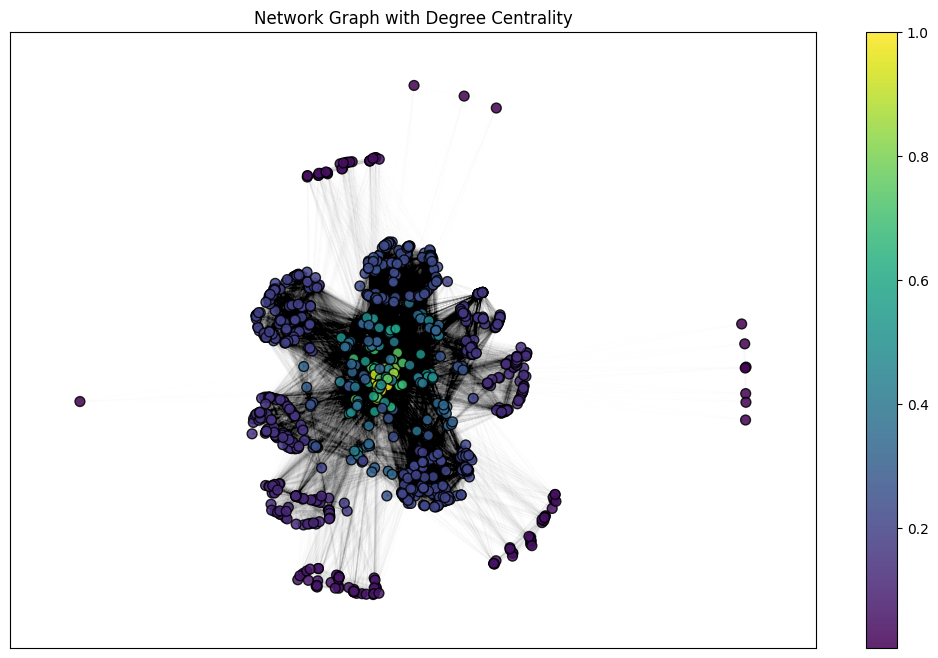

In [10]:
centrality_values = list(degree_centrality.values())

plt.figure(figsize=(13, 8))
pos = nx.spring_layout(G, seed=42)
nodes = nx.draw_networkx_nodes(G, pos, node_color=centrality_values, cmap=plt.cm.viridis, node_size=50, edgecolors='black', alpha=.85)
edges = nx.draw_networkx_edges(G, pos, alpha=.0025)

plt.colorbar(nodes)

plt.title("Network Graph with Degree Centrality")
plt.show()

As I said, before, spring layout places most interconnected nodes in the center. Let's zoom in and inspect the core.

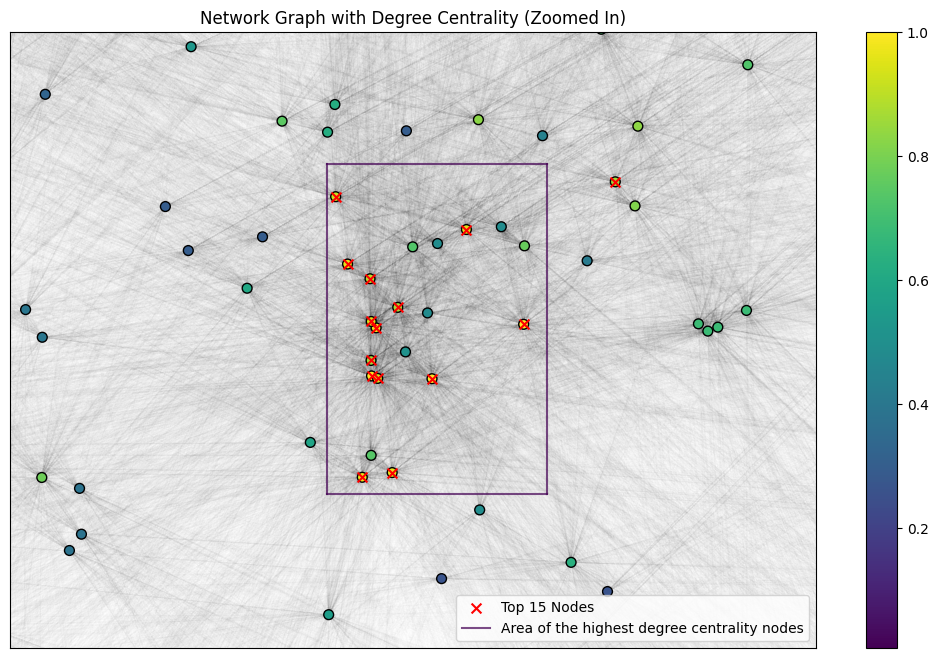

In [11]:
plt.figure(figsize=(13, 8))
pos = nx.spring_layout(G, seed=42)

nodes = nx.draw_networkx_nodes(
    G, pos, node_color=centrality_values, cmap=plt.cm.viridis, node_size=50,
    edgecolors='black')

edges = nx.draw_networkx_edges(G, pos, alpha=.0025)

nx.draw_networkx_nodes(
    G, pos, nodelist=top_15_node_namesD, node_shape='x', node_size=50, node_color='red', label='Top 15 Nodes'
)

# selection box
plt.plot([-.031,.01],[.03,.03],    DARK_BLUE, alpha=.7, label='Area of the highest degree centrality nodes')
plt.plot([-.031,.01],[-.045,-.045],DARK_BLUE, alpha=.7)
plt.plot([-.031,-.031],[.03,-.045],DARK_BLUE, alpha=.7)
plt.plot([.01,.01],[.03,-.045],    DARK_BLUE, alpha=.7)

plt.legend()
plt.colorbar(nodes)
plt.xlim(-.09, .06)
plt.ylim(-.08, .06)
plt.title("Network Graph with Degree Centrality (Zoomed In)")

plt.show()

Indeed, the nodes with the highest degree centrality are clustered at the very center of the graph. Let's see, what are these nodes.

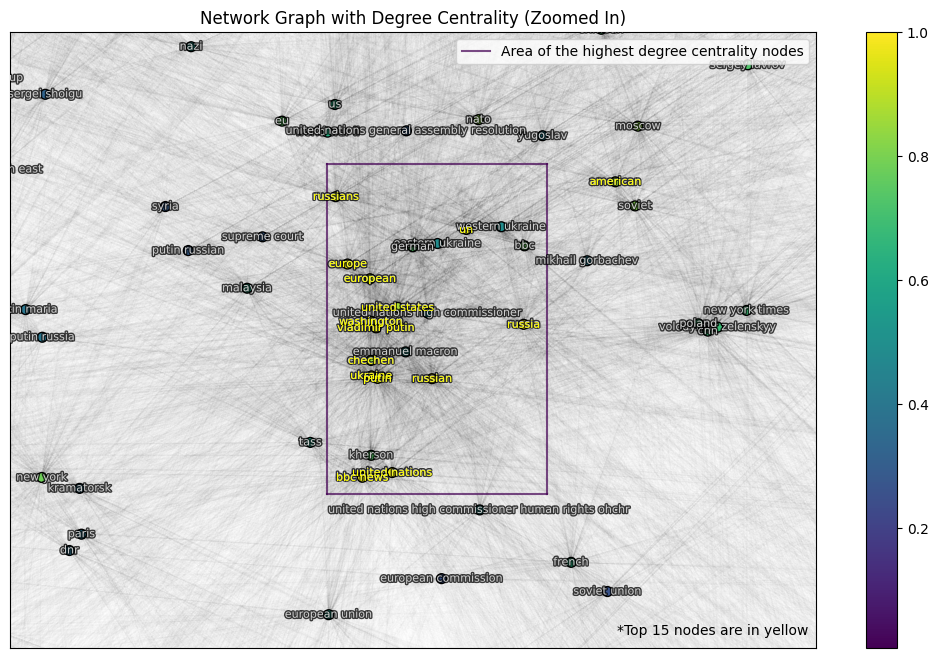

In [12]:
plt.figure(figsize=(13, 8))
pos = nx.spring_layout(G, seed=42)

nodes = nx.draw_networkx_nodes(
    G, pos, node_color=centrality_values, cmap=plt.cm.viridis, node_size=50,
    edgecolors='black')


edges = nx.draw_networkx_edges(G, pos, alpha=.0025)
labels = nx.draw_networkx_labels(G, pos, font_size=8, font_color='white', alpha=.75)
for _, t in labels.items():
    t.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'),
                        path_effects.Normal()])

top_15_labelsD = nx.draw_networkx_labels(G, pos, labels={node: node for node in top_15_node_namesD},
                                        font_size=8, font_color='yellow')

# selection box
plt.plot([-.031,.01],[.03,.03],    DARK_BLUE, alpha=.7, label='Area of the highest degree centrality nodes')
plt.plot([-.031,.01],[-.045,-.045],DARK_BLUE, alpha=.7)
plt.plot([-.031,-.031],[.03,-.045],DARK_BLUE, alpha=.7)
plt.plot([.01,.01],[.03,-.045],    DARK_BLUE, alpha=.7)

plt.text(.023,-.077,'*Top 15 nodes are in yellow')
plt.legend()
plt.colorbar(nodes)
plt.xlim(-.09, .06)
plt.ylim(-.08, .06)
plt.title("Network Graph with Degree Centrality (Zoomed In)")

plt.show()

We see that the center of the discourse is constituted from a vocabulary that includes names of states, nations, cities, continents ('ukraine', 'russia', 'russian', 'united states', 'washington','chechen', 'europe', 'european'), international organisations ('united nations', 'un'), and even news outlets ('bbc news'). The striking thing is that among the most interconnected nodes, the only person to be in the list is vladimir putin ('putin'). We didn't find in the list Ukrainian, American or EU member-states leaders. Let's take a look at betweenness centrality.

## Betweenness Centrality

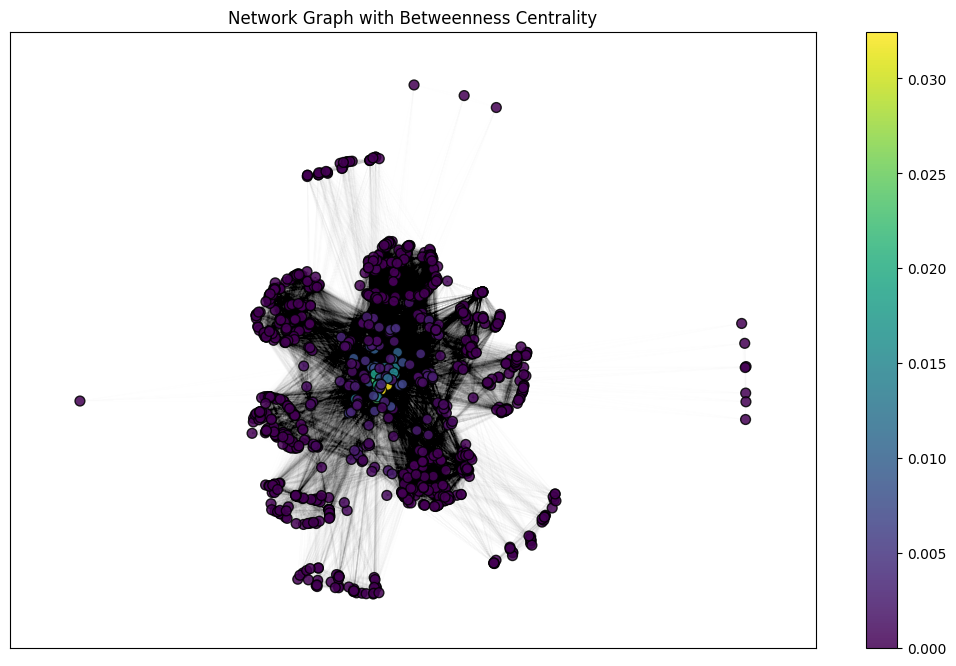

In [13]:
plt.figure(figsize=(13, 8))
pos = nx.spring_layout(G, seed=42)
nodes = nx.draw_networkx_nodes(G, pos, node_color=btw_centrality_values, cmap=plt.cm.viridis, node_size=50, 
                                edgecolors='black', alpha=.85)
edges = nx.draw_networkx_edges(G, pos, alpha=.0025)

cbar = plt.colorbar(nodes)

plt.title("Network Graph with Betweenness Centrality")
plt.show()

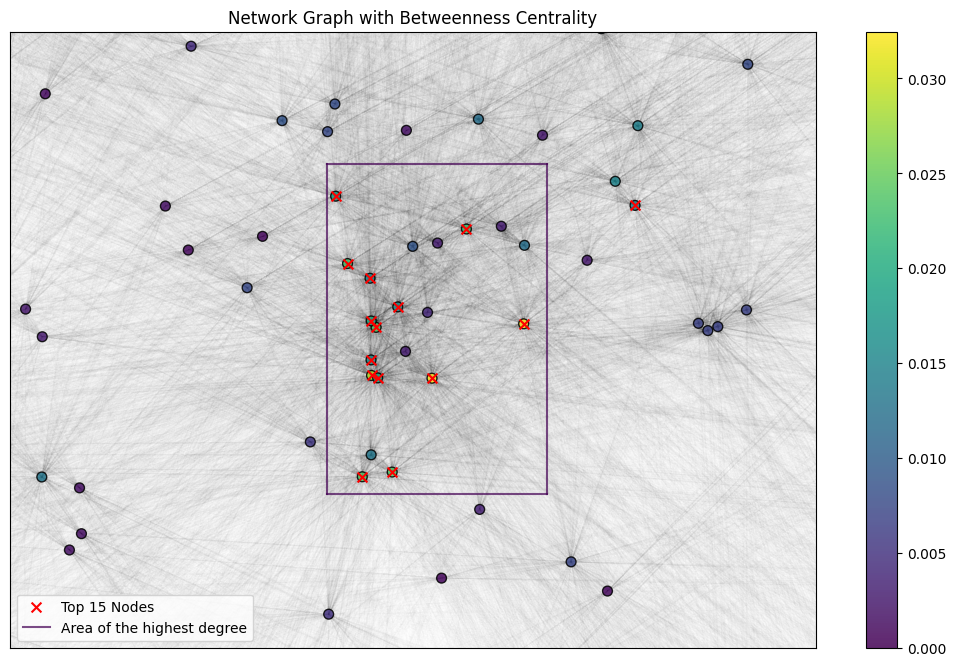

In [14]:
plt.figure(figsize=(13, 8))
pos = nx.spring_layout(G, seed=42)
nodes = nx.draw_networkx_nodes(G, pos, node_color=btw_centrality_values, cmap=plt.cm.viridis, node_size=50, 
                                edgecolors='black', alpha=.85)
edges = nx.draw_networkx_edges(G, pos, alpha=.0025)

nx.draw_networkx_nodes(
    G, pos, nodelist=top_15_node_namesB, node_shape='x', node_size=50, node_color='red', label='Top 15 Nodes'
)

# selection box
plt.plot([-.031,.01],[.03,.03],    DARK_BLUE, alpha=.7, label='Area of the highest degree')
plt.plot([-.031,.01],[-.045,-.045],DARK_BLUE, alpha=.7)
plt.plot([-.031,-.031],[.03,-.045],DARK_BLUE, alpha=.7)
plt.plot([.01,.01],[.03,-.045],    DARK_BLUE, alpha=.7)

plt.legend()
cbar = plt.colorbar(nodes)
plt.xlim(-.09, .06)
plt.ylim(-.08, .06)
plt.title("Network Graph with Betweenness Centrality")
plt.show()

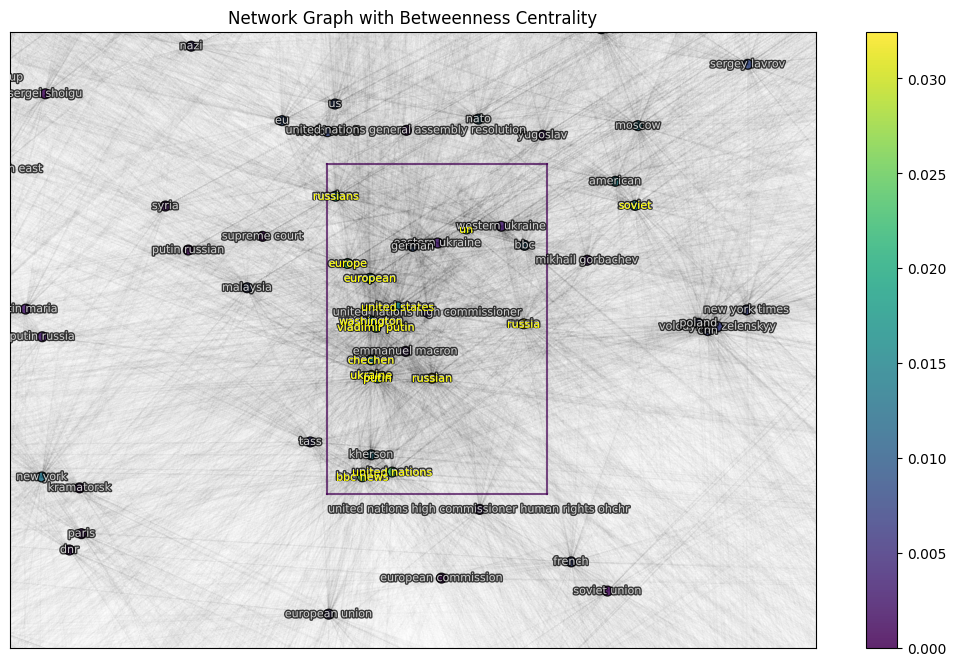

In [15]:
plt.figure(figsize=(13, 8))
pos = nx.spring_layout(G, seed=42)
nodes = nx.draw_networkx_nodes(G, pos, node_color=btw_centrality_values, cmap=plt.cm.viridis, node_size=50, 
                                edgecolors='black', alpha=.85)
edges = nx.draw_networkx_edges(G, pos, alpha=.0025)
labels = nx.draw_networkx_labels(G, pos, font_size=8, font_color='white', alpha=.75)
for _, t in labels.items():
    t.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'),
                        path_effects.Normal()])
top_15_labelsB = nx.draw_networkx_labels(G, pos, labels={node: node for node in top_15_node_namesB},
                                        font_size=8, font_color='yellow')

# selection box
plt.plot([-.031,.01],[.03,.03],    DARK_BLUE, alpha=.7)
plt.plot([-.031,.01],[-.045,-.045],DARK_BLUE, alpha=.7)
plt.plot([-.031,-.031],[.03,-.045],DARK_BLUE, alpha=.7)
plt.plot([.01,.01],[.03,-.045],    DARK_BLUE, alpha=.7)

cbar = plt.colorbar(nodes)
plt.xlim(-.09, .06)
plt.ylim(-.08, .06)
plt.title("Network Graph with Betweenness Centrality")
plt.show()

The list of the most interconnected nodes is the same, save for the presence of 'american' which is subsided with 'soviet'.

## Clustering

Let's look for clusters apply clustering algorithms to the adjacency matrix. We start from the classic k-means.

In [16]:
kmeans_per_k = [KMeans(n_clusters=k, n_init=10, random_state=42).fit(adj_matrix)
                for k in range(5, 31)]

inertias = [model.inertia_ for model in kmeans_per_k]

silhouette_scores = [silhouette_score(adj_matrix, model.labels_)
                    for model in kmeans_per_k]

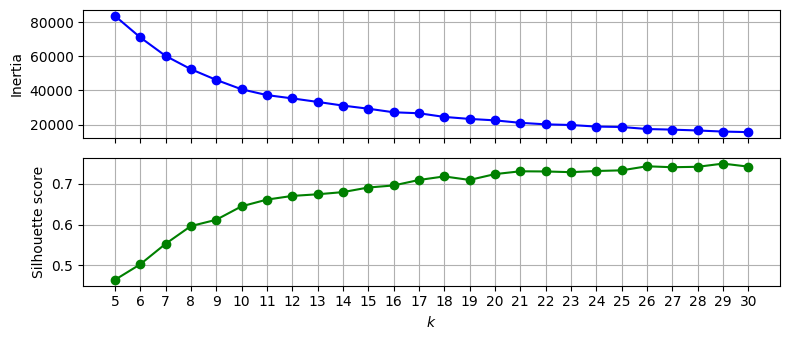

In [17]:
fig, axs = plt.subplots(2,1, figsize=(8,3.5), sharex=True)

axs[0].plot(range(5, 31), inertias, "bo-")
axs[0].set_ylabel("Inertia")
axs[0].grid()

axs[1].plot(range(5, 31), silhouette_scores, "go-")
axs[1].set_xlabel("$k$")
axs[1].set_xticks(range(5,31))
axs[1].set_ylabel("Silhouette score")
axs[1].grid()

plt.tight_layout()
plt.show()

First we have to choose an appropriate k. For this, I've created a plot of inertia score and sillhouette score versus k. Because sillhouette score doesn't indicate a clear winner, I decided the stick to the 'elbow rule' and choose k=10 based on the inertia-vs-k chart.

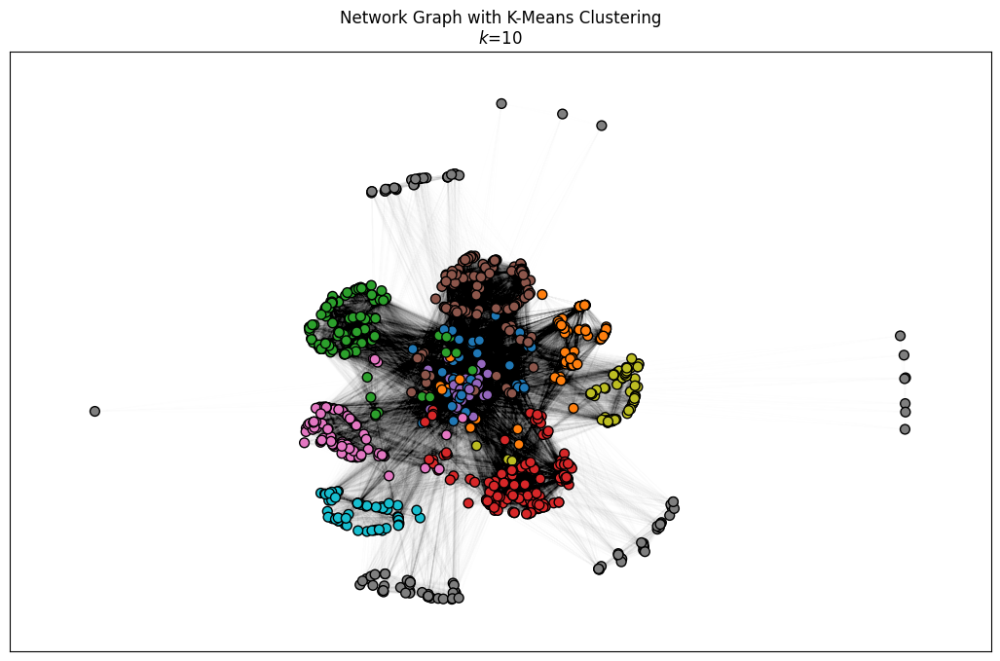

In [18]:
# Run K-Means clustering
num_clusters = 10  # Specify the number of clusters you want
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(adj_matrix)
labels = kmeans.labels_

# Assign colors to each cluster
cmap = plt.colormaps.get_cmap('tab20')
colors = [cmap(i / num_clusters) for i in range(num_clusters)]

# Compute positions for the graph
pos = nx.spring_layout(G, seed=42)

# Draw nodes with colors based on cluster assignment
plt.figure(figsize=(13, 8))
nodes = nx.draw_networkx_nodes(
    G, pos, node_color=[colors[label] for label in labels],
    node_size=50, edgecolors='black'
)

# Draw the edges
edges = nx.draw_networkx_edges(G, pos, alpha=.0025)


plt.title("Network Graph with K-Means Clustering\n$k$=10")
plt.show()


The resutls are good for the the 'outer core' cluster but the center is pieced between different clusters. Let's apply density-based algorithms instead. Below is the application of DBSCAN, HDBSCAN, and OPTICS to the graph.

11


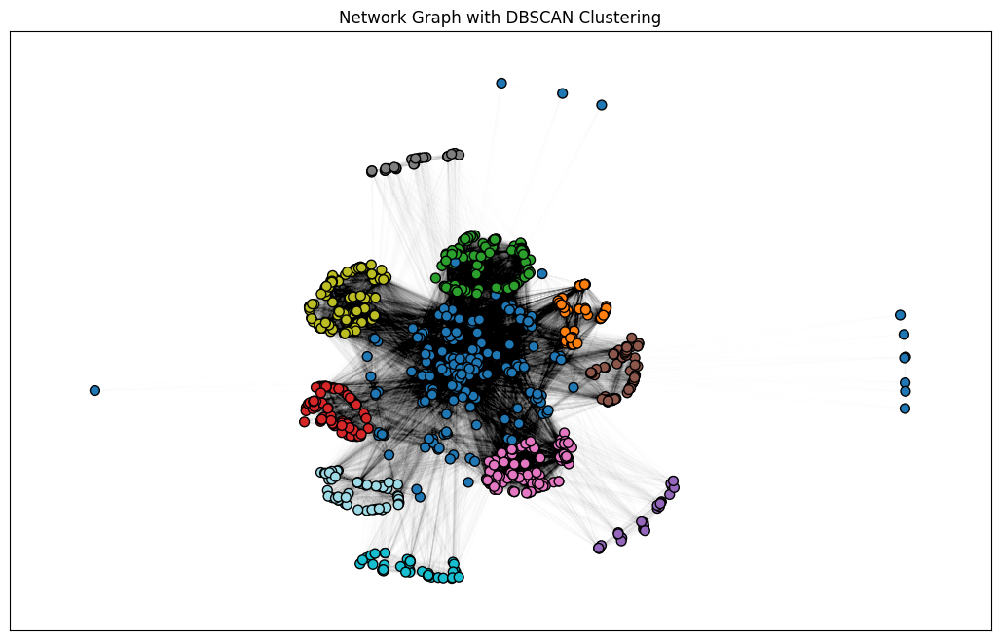

In [19]:
# Run DBSCAN clustering
dbscan = DBSCAN(eps=6, min_samples=20, metric='euclidean')  # Adjust eps and min_samples as needed
dbscan.fit(adj_matrix)
labels_final = dbscan.labels_

print(np.unique(labels_final).shape[0])

# Determine the number of clusters, ignoring noise (-1 label)
num_clusters_final = len(set(labels_final)) - (1 if -1 in labels_final else 0)

# Assign colors to each cluster
cmap = plt.colormaps.get_cmap('tab20')
colors_final = [cmap(i / num_clusters_final) if i != -1 else (0, 0, 0, 1) for i in range(num_clusters_final + 1)]

# Compute positions for the graph
pos = nx.spring_layout(G, seed=42)

# Draw nodes with colors based on cluster assignment
plt.figure(figsize=(13, 8))
nodes = nx.draw_networkx_nodes(
    G, pos, node_color=[colors_final[label + 1] for label in labels_final],  # Use label + 1 to handle -1 labels correctly
    node_size=50, edgecolors='black'
)

# Draw the edges
edges = nx.draw_networkx_edges(G, pos, alpha=.0025)
plt.title("Network Graph with DBSCAN Clustering")

# Show the plot
plt.show()

11


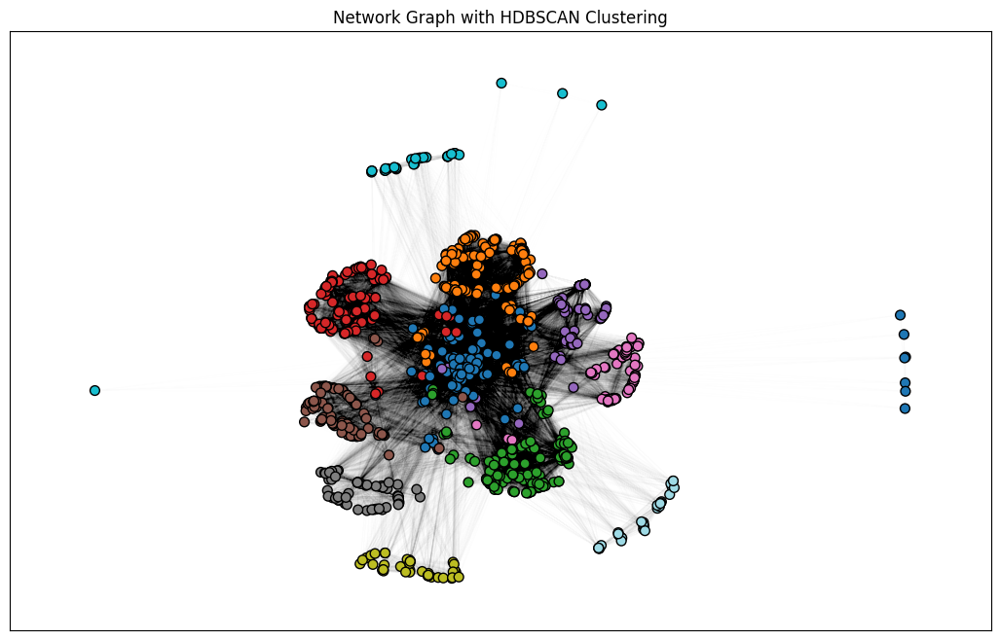

In [20]:
# Run HDBSCAN clustering
hdbscan = HDBSCAN(min_samples=20)  # Adjust eps and min_samples as needed
hdbscan.fit(adj_matrix)
labels = hdbscan.labels_

print(np.unique(labels).shape[0])

# Determine the number of clusters, ignoring noise (-1 label)
num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

# Assign colors to each cluster
cmap = plt.colormaps.get_cmap('tab20')
colors = [cmap(i / num_clusters) if i != -1 else (0, 0, 0, 1) for i in range(num_clusters + 1)]

# Compute positions for the graph
pos = nx.spring_layout(G, seed=42)

# Draw nodes with colors based on cluster assignment
plt.figure(figsize=(13, 8))
nodes = nx.draw_networkx_nodes(
    G, pos, node_color=[colors[label + 1] for label in labels],  # Use label + 1 to handle -1 labels correctly
    node_size=50, edgecolors='black'
)

# Draw the edges
edges = nx.draw_networkx_edges(G, pos, alpha=.0025)
plt.title("Network Graph with HDBSCAN Clustering")

# Show the plot
plt.show()

11


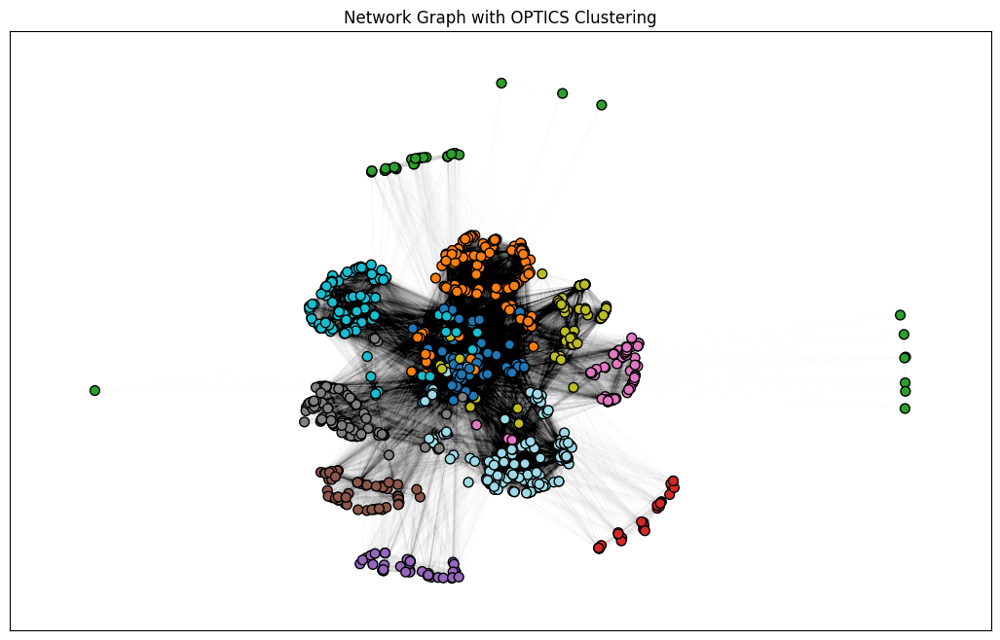

In [21]:
# Run OPTICS clustering
optics = OPTICS(min_samples=20)  # Adjust eps and min_samples as needed
optics.fit(adj_matrix)
labels = optics.labels_

print(np.unique(labels).shape[0])

# Determine the number of clusters, ignoring noise (-1 label)
num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

# Assign colors to each cluster
cmap = plt.colormaps.get_cmap('tab20')
colors = [cmap(i / num_clusters) if i != -1 else (0, 0, 0, 1) for i in range(num_clusters + 1)]

# Compute positions for the graph
pos = nx.spring_layout(G, seed=42)

# Draw nodes with colors based on cluster assignment
plt.figure(figsize=(13, 8))
nodes = nx.draw_networkx_nodes(
    G, pos, node_color=[colors[label + 1] for label in labels],  # Use label + 1 to handle -1 labels correctly
    node_size=50, edgecolors='black'
)

# Draw the edges
edges = nx.draw_networkx_edges(G, pos, alpha=.0025)
plt.title("Network Graph with OPTICS Clustering")

# Show the plot
plt.show()

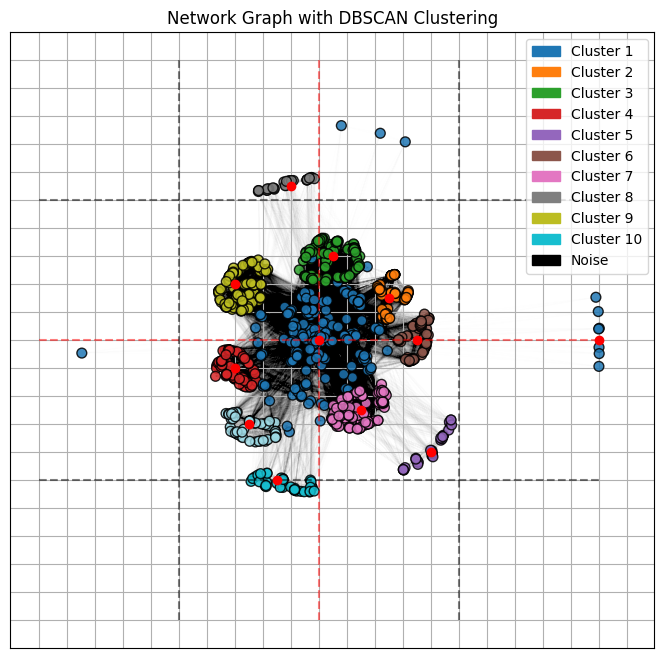

In [22]:
# Compute positions for the graph
pos = nx.spring_layout(G, seed=42)

# Draw nodes with colors based on cluster assignment
plt.figure(figsize=(13, 8))
nodes = nx.draw_networkx_nodes(
    G, pos, node_color=[colors_final[label + 1] for label in labels_final],  # Use label + 1 to handle -1 labels correctly
    node_size=50, edgecolors='black', alpha=.85
)

edges = nx.draw_networkx_edges(G, pos, alpha=.0025)

# Create custom legend
handles = []
for i in range(num_clusters):
    handles.append(mpatches.Patch(color=colors[i], label=f'Cluster {i+1}'))
if -1 in labels:
    handles.append(mpatches.Patch(color='black', label='Noise'))

plt.legend(handles=handles, loc='best')


# helper lines
plt.plot([-1, 1], [0,0], 'r--', alpha=.5)
plt.plot([0, 0], [-1,1], 'r--', alpha=.5)
plt.plot([-.5, -.5], [-1,1], 'k--', alpha=.5)
plt.plot([.5, .5], [-1,1], 'k--', alpha=.5)
plt.plot([-1, 1], [.5,.5], 'k--', alpha=.5)
plt.plot([-1, 1], [-.5,-.5], 'k--', alpha=.5)

plt.plot([0], [0], 'ro')
plt.plot([.05], [.3], 'ro')
plt.plot([.25], [.15], 'ro')
plt.plot([.35], [0], 'ro')
plt.plot([.15], [-.25], 'ro')

plt.plot([.4], [-.4], 'ro')
plt.plot([-.15], [-.5], 'ro')
plt.plot([-.25], [-.3], 'ro')
plt.plot([-.3], [-.1], 'ro')
plt.plot([-.3], [.2], 'ro')

plt.plot([-.1], [.55], 'ro')
plt.plot([1], [0], 'ro')

plt.gca().set_aspect('equal')
plt.xticks(np.arange(-1,1.2,.1))
plt.yticks(np.arange(-1,1.2,.1))
plt.grid(True)
plt.title("Network Graph with DBSCAN Clustering")
plt.show()

The winner is clearly DBSCAN for it created a clear center core. Now, let's look for different clusters with labels.

In [23]:
poi =  [([0],     [0]   ),
        ([.05],   [.3]  ),
        ([.25],   [.15] ),
        ([.35],   [0]   ),
        ([.15],   [-.25]),
        ([.4],    [-.4] ),
        ([-.15],  [-.5] ),
        ([-.25],  [-.3] ),
        ([-.3],   [-.1] ),
        ([-.3],   [.2]  ),
        ([-.1],   [.55] ),
        ([1],     [0]   )]

print(len(poi))
print(poi)

12
[([0], [0]), ([0.05], [0.3]), ([0.25], [0.15]), ([0.35], [0]), ([0.15], [-0.25]), ([0.4], [-0.4]), ([-0.15], [-0.5]), ([-0.25], [-0.3]), ([-0.3], [-0.1]), ([-0.3], [0.2]), ([-0.1], [0.55]), ([1], [0])]


In [24]:
num_clusters = len(set(labels_final)) - (1 if -1 in labels_final else 0)
colors = [cmap(i / num_clusters) if i != -1 else (0, 0, 0, 1) for i in range(num_clusters + 1)]
node_colors = [colors[label + 1] for label in labels_final]

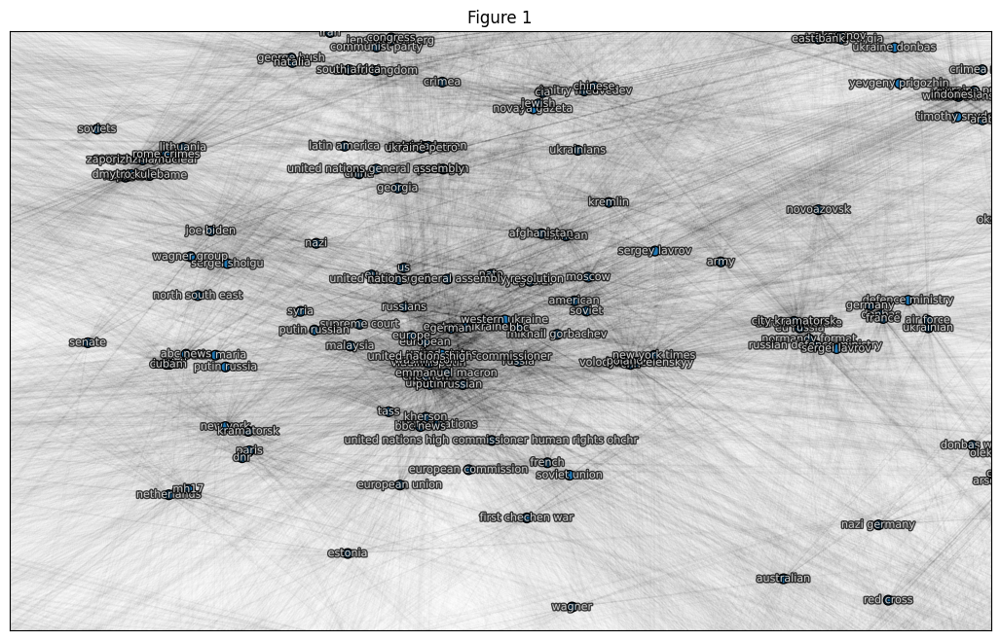

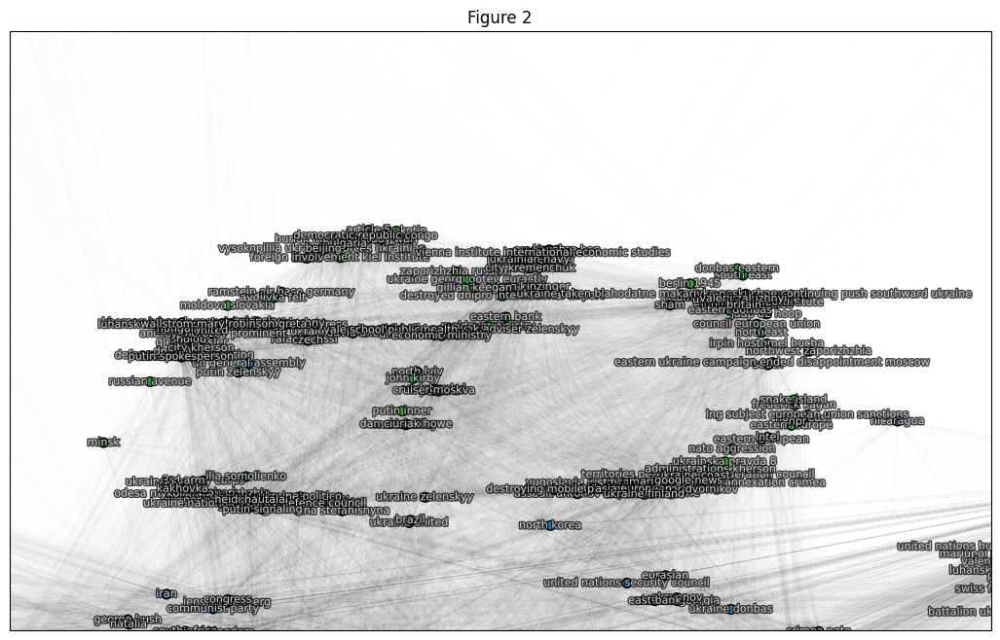

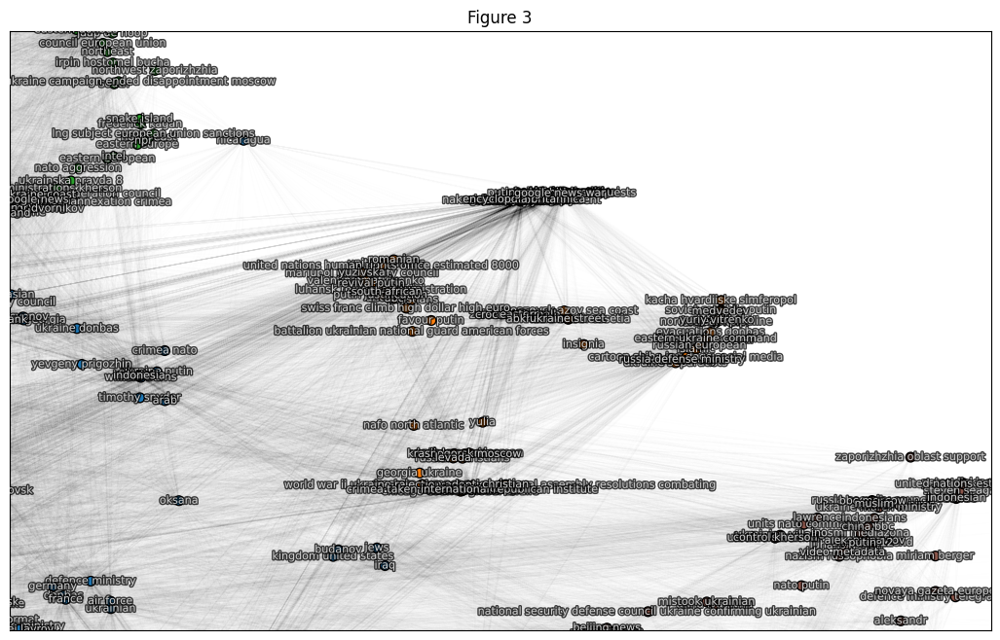

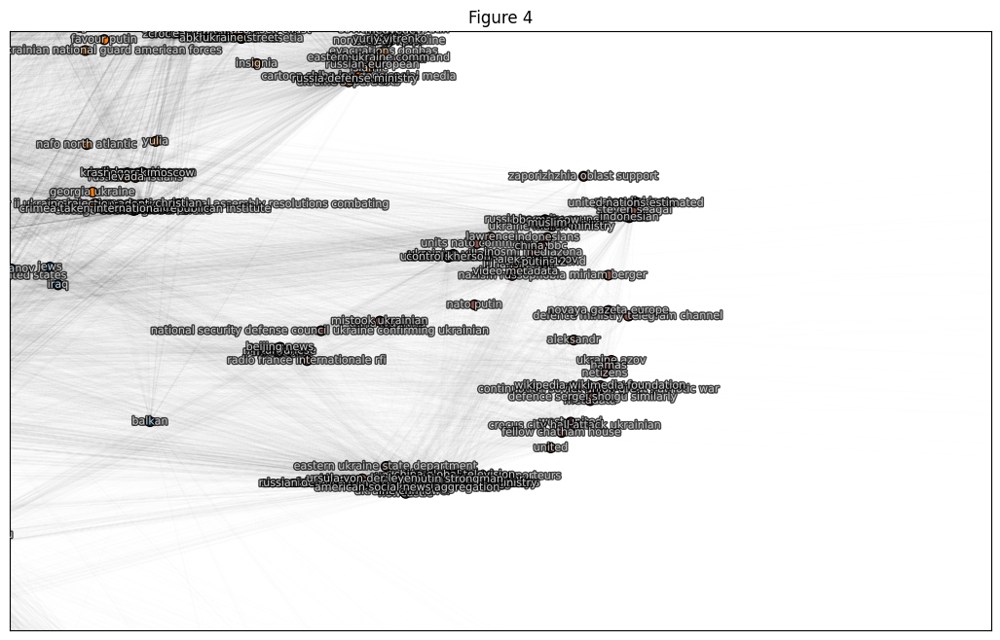

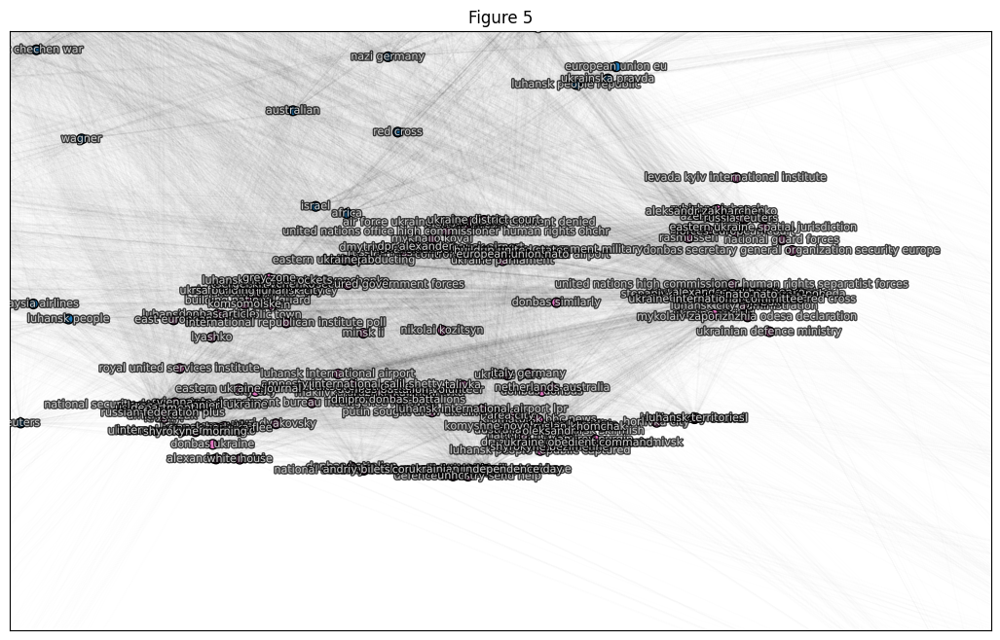

...

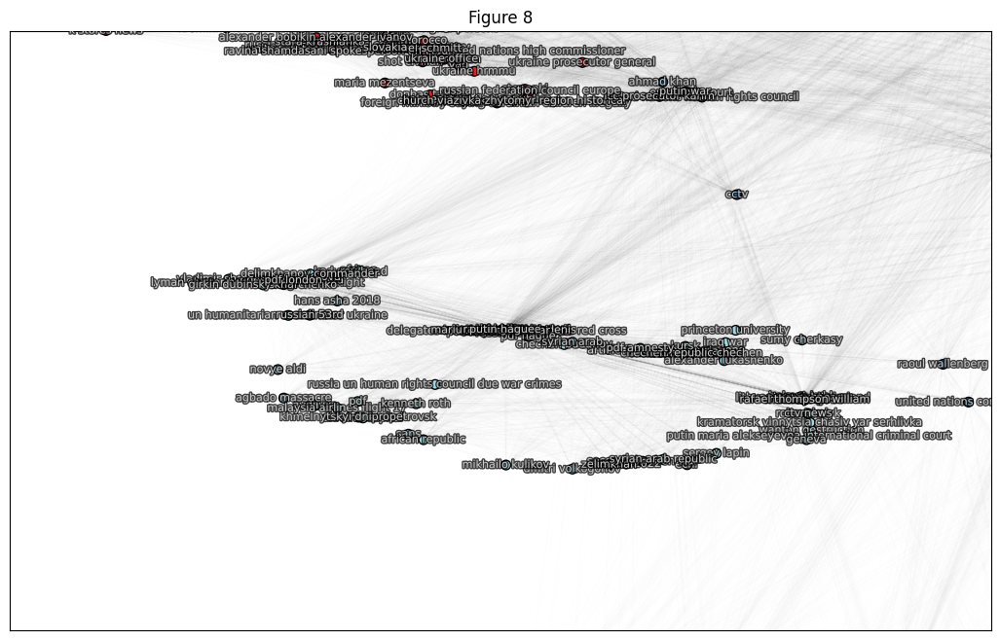

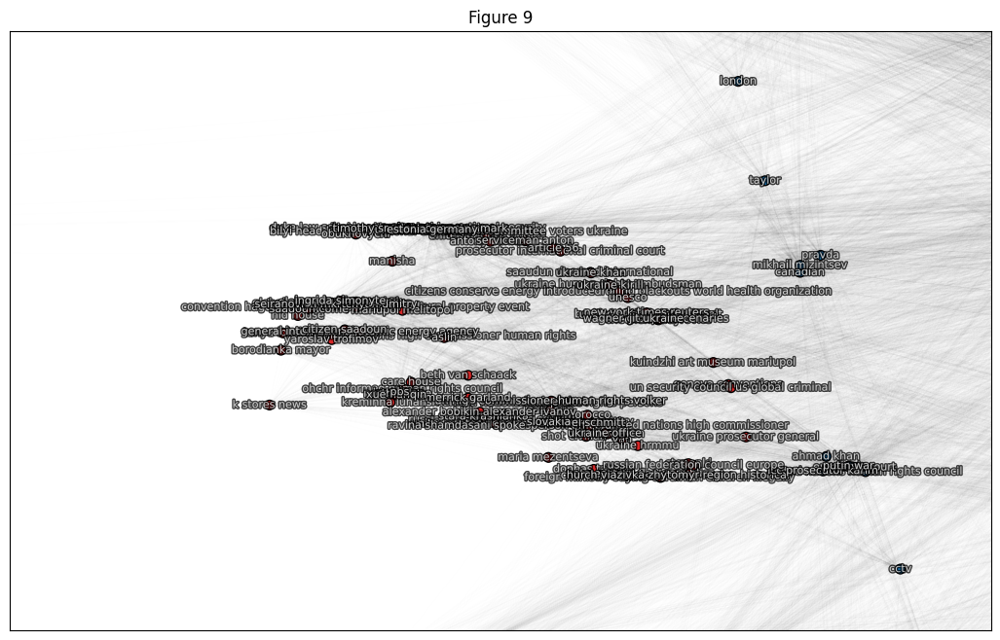

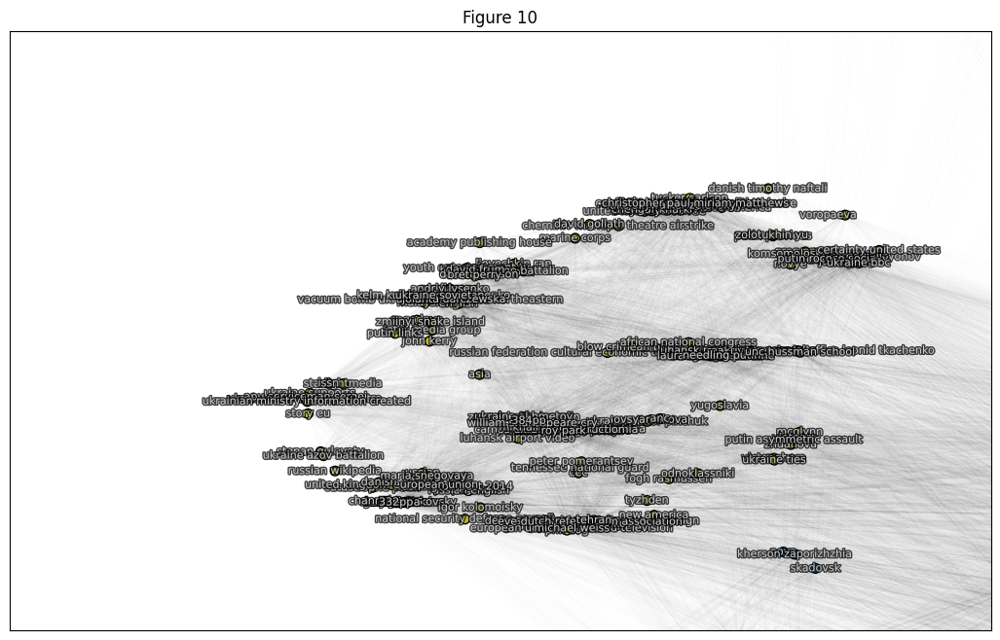

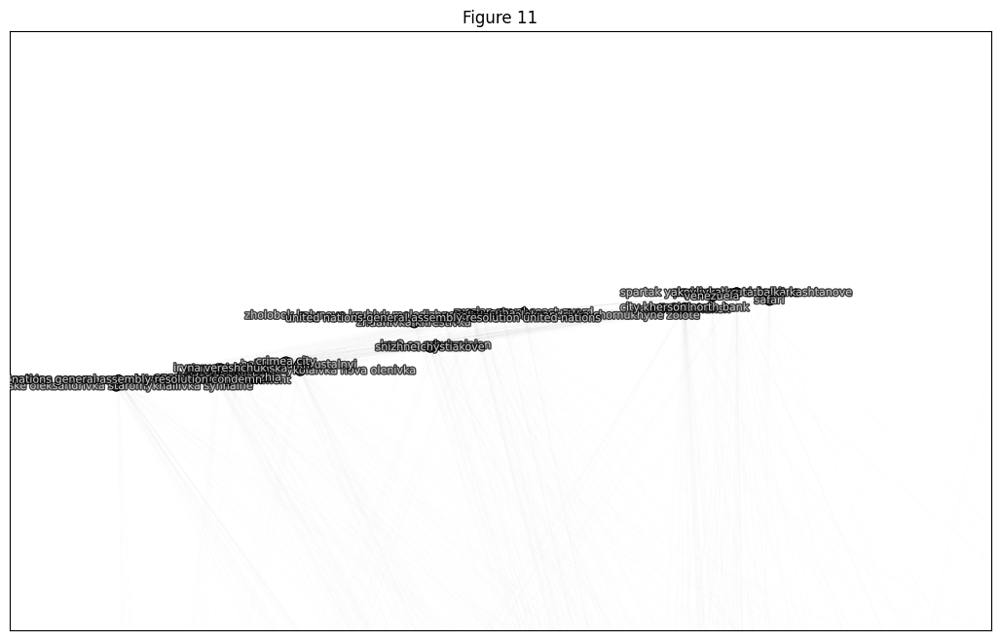

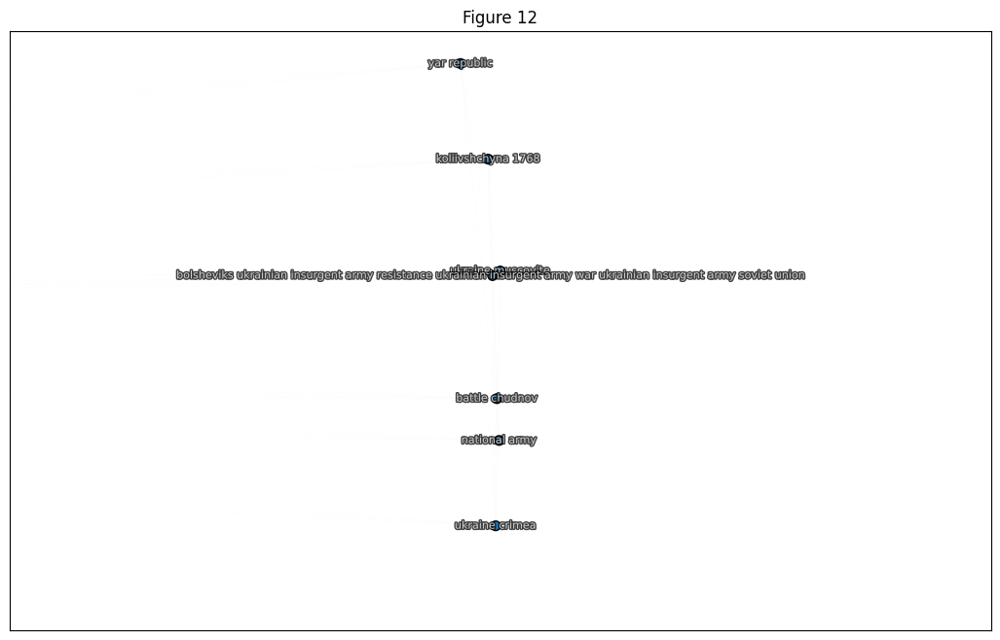

In [25]:
for idx, c in enumerate(poi):

    plt.figure(figsize=(13, 8))
    pos = nx.spring_layout(G, seed=42)

    nodes = nx.draw_networkx_nodes(
        G, pos, node_color=node_colors, node_size=50,
        edgecolors='black')

    edges = nx.draw_networkx_edges(G, pos, alpha=.0025)
    labels = nx.draw_networkx_labels(G, pos, font_size=8, font_color='white', alpha=.75)
    for _, t in labels.items():
        t.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'),
                            path_effects.Normal()])

    plt.xlim([c[0][0] - 0.15, c[0][0] + 0.15])
    plt.ylim([c[1][0] - 0.15, c[1][0] + 0.17])

    plt.title(f'Figure {idx+1}')
    
    plt.show()

Here we can see sevelar things:

1. Our NER model had a quirk, it extracted not only the actual named entities but sometimes a combination of those entities. We see 'putin' in almost any clusterk. However, additional mentions frequently do not add much new information. As a result, graph looks saturated with repetitions. So, for future work a more sophisticated filtering is required.
2. Except for the center of the graph depicted on the Fig.1 which represents the "center" of the discourse and the last figure (Fig. 12) which clearly refers to the Ukrainian historical events, all the other groups looks like a microcosm with similar vocabulary. The clusters aren't grouped by similarity. This may be because each cluster represents a particular source. For a more clear interpretation, further inspection of sources is needed.

## Conclusions

In this notebook we made a comprehensive analysis and interpretation of graph data using advanced centrality and clustering techniques. We started by loading and preparing the graph data from a JSON file, converting it into a NetworkX graph and an adjacency matrix suitable for clustering. Centrality analysis is conducted, specifically focusing on degree and betweenness centralities, to identify the most influential nodes within the network. The top 15 nodes are highlighted and examined in detail. Clustering algorithms such as KMeans, DBSCAN, HDBSCAN, and OPTICS are applied to uncover the underlying structure and segment the graph into meaningful clusters. The results are visualized using Matplotlib, with color-coded nodes and a legend for clarity. This thorough analysis not only identifies key nodes and their roles but also provides insights into the network's modularity and community structure, demonstrating the practical application of ML in extracting and interpreting complex relationships from large textual datasets. ​​

----------------
Illia Nesterenko